# AIN429 Data Mining Lab
## Assignment 3 : Clustering
#### Student Number: 21992919
##### Student Name/Surname : Melike Nur DULKADİR

Importing necessary libraries and after then starting the project.

In [429]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from scipy.spatial import distance_matrix
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster import hierarchy
from matplotlib import pyplot
from sklearn.cluster import DBSCAN
from numpy import unique, where
import warnings
warnings.filterwarnings("ignore")

In [430]:
df = pd.read_csv("data.csv",delimiter=";")

In [431]:
df.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207
4,85,44.0,70.0,205.0,103.0,52,149.0,45.0,19.0,144,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183


# Analyzing the dataset

The check_df function is used to examine the dataset in a general way.

In [432]:
def check_df(dataframe, head=5):
    print("##################### Shape #####################")
    print(dataframe.shape)
    print("##################### Types #####################")
    print(dataframe.dtypes)
    print("##################### NA #####################")
    print(dataframe.isnull().sum())
    print("##################### Quantiles #####################")
    print(dataframe.quantile([0, 0.05, 0.50, 0.95, 0.99, 1]).T)
    print("##################### Properties #####################")
    print(df.describe())

The following functions are used to detect and handle outliers.

In [433]:
def outlier_thresholds(dataframe, col_name, q1=0.25, q3=0.75):
    quartile1 = dataframe[col_name].quantile(q1)
    quartile3 = dataframe[col_name].quantile(q3)
    interquantile_range = quartile3 - quartile1
    up_limit = quartile3 + 1.5 * interquantile_range
    low_limit = quartile1 - 1.5 * interquantile_range
    return low_limit, up_limit

In [434]:
def check_outlier(dataframe, col_name, q1=.25, q3=.75):
    low_limit, up_limit = outlier_thresholds(dataframe, col_name, q1, q3)
    if dataframe[(dataframe[col_name] > up_limit) | (dataframe[col_name] < low_limit)].any(axis=None):
        return True
    else:
        return False

In [435]:
def replace_with_thresholds(dataframe, variable, q1=0.25, q3=0.75):
    low_limit, up_limit = outlier_thresholds(dataframe, variable, q1, q3)
    dataframe.loc[(dataframe[variable] < low_limit), variable] = low_limit
    dataframe.loc[(dataframe[variable] > up_limit), variable] = up_limit

In [436]:
check_df(df)

##################### Shape #####################
(846, 18)
##################### Types #####################
compactness                      int64
circularity                    float64
distance_circularity           float64
radius_ratio                   float64
pr.axis_aspect_ratio           float64
max.length_aspect_ratio          int64
scatter_ratio                  float64
elongatedness                  float64
pr.axis_rectangularity         float64
max.length_rectangularity        int64
scaled_variance                float64
scaled_variance.1              float64
scaled_radius_of_gyration      float64
scaled_radius_of_gyration.1    float64
skewness_about                 float64
skewness_about.1               float64
skewness_about.2               float64
hollows_ratio                    int64
dtype: object
##################### NA #####################
compactness                    0
circularity                    5
distance_circularity           4
radius_ratio                

Here we observe that all features are numerical features.

In [437]:
df.corr()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
compactness,1.000000,0.689786,0.791707,0.691081,0.091779,0.148249,0.812770,-0.788736,0.814248,0.676143,0.764361,0.818674,0.585845,-0.250603,0.236685,0.157670,0.298528,0.365552
circularity,0.689786,1.000000,0.797180,0.625051,0.154283,0.251407,0.858265,-0.827246,0.856603,0.965729,0.806791,0.850863,0.935950,0.053080,0.144968,-0.011869,-0.106339,0.045652
distance_circularity,0.791707,0.797180,1.000000,0.771748,0.158684,0.264621,0.907949,-0.913020,0.896273,0.775149,0.865710,0.890541,0.706950,-0.227001,0.114665,0.266049,0.146027,0.333648
radius_ratio,0.691081,0.625051,0.771748,1.000000,0.665363,0.450486,0.738480,-0.792946,0.712744,0.571083,0.798294,0.725598,0.541325,-0.181520,0.049112,0.174469,0.382912,0.472339
pr.axis_aspect_ratio,0.091779,0.154283,0.158684,0.665363,1.000000,0.648861,0.103832,-0.183492,0.079566,0.127322,0.273738,0.089750,0.122454,0.152860,-0.058539,-0.032180,0.240201,0.267760
max.length_aspect_ratio,0.148249,0.251407,0.264621,0.450486,0.648861,1.000000,0.165998,-0.180053,0.161603,0.305943,0.319033,0.143745,0.189752,0.295638,0.015446,0.043491,-0.026184,0.143919
scatter_ratio,0.812770,0.858265,0.907949,0.738480,0.103832,0.165998,1.000000,-0.973504,0.992078,0.810017,0.951672,0.996328,0.800577,-0.028006,0.074376,0.213512,0.005171,0.118504
elongatedness,-0.788736,-0.827246,-0.913020,-0.792946,-0.183492,-0.180053,-0.973504,1.000000,-0.950405,-0.776150,-0.938313,-0.956488,-0.766671,0.103535,-0.052243,-0.186027,-0.114846,-0.216769
pr.axis_rectangularity,0.814248,0.856603,0.896273,0.712744,0.079566,0.161603,0.992078,-0.950405,1.000000,0.813135,0.938182,0.992316,0.798522,-0.015711,0.083219,0.215200,-0.019066,0.099481
max.length_rectangularity,0.676143,0.965729,0.775149,0.571083,0.127322,0.305943,0.810017,-0.776150,0.813135,1.000000,0.746657,0.797485,0.866554,0.041283,0.136077,0.001660,-0.104437,0.076770


<AxesSubplot: title={'center': 'Corelation Between Features'}>

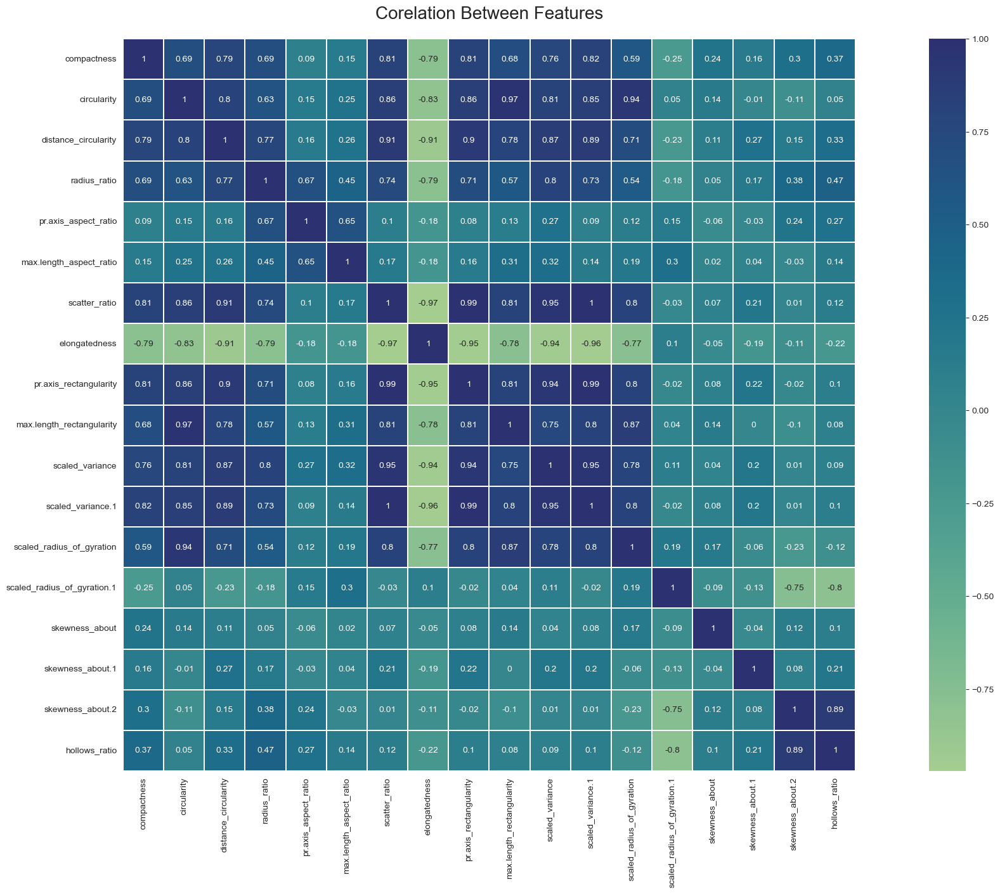

In [438]:
corelation = plt.cm.viridis   # Color range used in heat map
plt.figure(figsize=(30,15))
plt.title('Corelation Between Features', y=1.02, size=20)

sns.heatmap(data=df.corr().round(2), linewidths=0.2, vmax=1, square=True, annot=True, cmap="crest", linecolor='white')

# Preprocessing

## Handling Missing Values

In [439]:
missing_values_cols=df.columns[df.isnull().any()]
df[df.isnull().any(axis=1)][missing_values_cols]

,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2
5,NaN,106.0,172.0,50.0,255.0,26.0,28.0,280.0,957.0,264.0,85.0,5.0,9.0,181.0
9,44.0,98.0,NaN,62.0,183.0,36.0,22.0,202.0,505.0,152.0,64.0,4.0,14.0,195.0
19,56.0,100.0,215.0,NaN,208.0,32.0,24.0,227.0,651.0,223.0,74.0,6.0,5.0,186.0
35,46.0,NaN,172.0,67.0,157.0,43.0,20.0,170.0,363.0,184.0,67.0,17.0,7.0,192.0
66,43.0,68.0,125.0,57.0,149.0,46.0,19.0,169.0,323.0,172.0,NaN,NaN,18.0,179.0
70,55.0,98.0,161.0,54.0,215.0,31.0,NaN,226.0,683.0,221.0,76.0,3.0,6.0,185.0
77,40.0,62.0,140.0,62.0,150.0,45.0,19.0,165.0,330.0,173.0,NaN,2.0,3.0,180.0
78,52.0,94.0,NaN,66.0,208.0,31.0,24.0,227.0,666.0,218.0,76.0,11.0,4.0,193.0
105,NaN,103.0,202.0,64.0,220.0,30.0,25.0,NaN,711.0,214.0,73.0,11.0,NaN,188.0
118,NaN,NaN,128.0,56.0,150.0,46.0,19.0,168.0,324.0,173.0,82.0,9.0,14.0,180.0


#### *Missing Treatment Values for circularity*

In [440]:
df[df['circularity'].isnull()][missing_values_cols]

,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2
5,NaN,106.0,172.0,50.0,255.0,26.0,28.0,280.0,957.0,264.0,85.0,5.0,9.0,181.0
105,NaN,103.0,202.0,64.0,220.0,30.0,25.0,NaN,711.0,214.0,73.0,11.0,NaN,188.0
118,NaN,NaN,128.0,56.0,150.0,46.0,19.0,168.0,324.0,173.0,82.0,9.0,14.0,180.0
266,NaN,65.0,116.0,53.0,152.0,45.0,19.0,175.0,335.0,NaN,85.0,5.0,4.0,179.0
396,NaN,106.0,177.0,51.0,256.0,26.0,28.0,285.0,966.0,261.0,87.0,11.0,2.0,182.0


There are missing values in the circularity column in 5 rows. One of the 5 lines also has a missing value for distance_circularity. Another row has missing values for scaled_variance and skewness_about.1. One of the rows has missing value for scaled_radius_of_gyration.

In [441]:
df.drop([105,118,266], inplace=True)

In [442]:
median_circularity=df['circularity'].median()
median_circularity

44.0

In [443]:
df['circularity'].fillna(median_circularity, inplace=True)

Rows with missing values in other columns were dropped, while other missing values were loaded with the median.

#### *Missing Treatment Values for distance_circularity*

In [444]:
df[df['distance_circularity'].isnull()][missing_values_cols]

,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2
35,46.0,NaN,172.0,67.0,157.0,43.0,20.0,170.0,363.0,184.0,67.0,17.0,7.0,192.0
207,42.0,NaN,121.0,55.0,149.0,46.0,19.0,167.0,323.0,NaN,85.0,1.0,6.0,179.0
319,51.0,NaN,194.0,60.0,220.0,30.0,25.0,247.0,731.0,209.0,80.0,7.0,7.0,188.0


3 rows have missing values in the distance_circularity column. Row 207 has missing values in more than 1 column. So this row will be dropped. 35, 319 have missing values in just one column, so these columns will be imputed with median.

In [445]:
df.drop(207, inplace=True)

In [446]:
median_distance_circularity=df['distance_circularity'].median()
median_distance_circularity

80.0

In [447]:
df['distance_circularity'].fillna(median_distance_circularity, inplace=True)

#### *Missing Treatment Values for radius_ratio*

In [448]:
df[df['radius_ratio'].isnull()][missing_values_cols]

,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2
9,44.0,98.0,NaN,62.0,183.0,36.0,22.0,202.0,505.0,152.0,64.0,4.0,14.0,195.0
78,52.0,94.0,NaN,66.0,208.0,31.0,24.0,227.0,666.0,218.0,76.0,11.0,4.0,193.0
159,45.0,75.0,NaN,57.0,150.0,44.0,19.0,170.0,335.0,180.0,66.0,16.0,2.0,193.0
287,43.0,84.0,NaN,55.0,154.0,44.0,19.0,174.0,350.0,164.0,73.0,6.0,2.0,185.0
345,54.0,106.0,NaN,57.0,236.0,28.0,26.0,256.0,833.0,253.0,81.0,6.0,14.0,185.0
467,54.0,104.0,NaN,58.0,215.0,31.0,24.0,221.0,682.0,222.0,75.0,13.0,23.0,186.0


For all the rows with missing radius_ratio only radius ratio is having missing values all the other columns have values. So these rows will not drop any rather replace with median.

In [449]:
median_radius_ratio=df['radius_ratio'].median()
median_radius_ratio

167.0

In [450]:
df['radius_ratio'].fillna(median_radius_ratio, inplace=True)

#### *Missing Treatment Values for pr.axis_aspect_ratio*

In [451]:
df[df['pr.axis_aspect_ratio'].isnull()][missing_values_cols]

,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2
19,56.0,100.0,215.0,NaN,208.0,32.0,24.0,227.0,651.0,223.0,74.0,6.0,5.0,186.0
222,50.0,81.0,197.0,NaN,186.0,34.0,22.0,206.0,531.0,198.0,74.0,NaN,1.0,197.0


There are 2 rows with missing values. One row has missing value in one more column in addition to pr.axis_aspect_ratio. This row will be dropped but treat the missing value in pr.axis_aspect_ratio with median.

In [452]:
df.drop(222, inplace=True)

In [453]:
median_pr_axis_aspect_ratio=df['pr.axis_aspect_ratio'].median()
median_pr_axis_aspect_ratio

61.0

In [454]:
df['pr.axis_aspect_ratio'].fillna(median_pr_axis_aspect_ratio, inplace=True)

#### *Missing Treatment Values for scatter_ratio*

In [455]:
df[df['scatter_ratio'].isnull()][missing_values_cols]

,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2
249,34.0,53.0,127.0,58.0,NaN,58.0,17.0,137.0,197.0,127.0,70.0,NaN,20.0,185.0


Only one row and 2 cols have missing value in that row including scatter_ratio. So these rows will be dropped.

In [456]:
df.drop(249, inplace=True)

#### *Missing Treatment Values for elongatednes*

In [457]:
df[df['elongatedness'].isnull()][missing_values_cols]

,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2
215,39.0,86.0,169.0,62.0,162.0,NaN,20.0,194.0,388.0,147.0,74.0,1.0,22.0,185.0


In [458]:
median_distance_elongatedness=df['elongatedness'].median()
median_distance_elongatedness

43.0

In [459]:
df['elongatedness'].fillna(median_distance_elongatedness, inplace=True)

#### *Missing Treatment Values for pr.axis_rectangularity*

In [460]:
df[df['pr.axis_rectangularity'].isnull()][missing_values_cols]

,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2
70,55.0,98.0,161.0,54.0,215.0,31.0,NaN,226.0,683.0,221.0,76.0,3.0,6.0,185.0
237,45.0,65.0,128.0,56.0,151.0,45.0,NaN,170.0,332.0,186.0,81.0,1.0,10.0,179.0
273,45.0,80.0,162.0,63.0,146.0,46.0,NaN,161.0,316.0,161.0,64.0,5.0,10.0,199.0


3 rows have missing values for pr.axis_rectangularity and only this column has missing value. So this value will be replaced with median value.

In [461]:
median_pr_axis_rectangularity=df['pr.axis_rectangularity'].median()
median_pr_axis_rectangularity

20.0

In [462]:
df['pr.axis_rectangularity'].fillna(median_pr_axis_rectangularity, inplace=True)

#### *Missing Treatment Values for scaled_variance*

In [463]:
df[df['scaled_variance'].isnull()][missing_values_cols]

,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2
372,47.0,87.0,164.0,64.0,156.0,43.0,20.0,NaN,359.0,182.0,68.0,1.0,13.0,192.0
522,36.0,69.0,162.0,63.0,140.0,48.0,18.0,NaN,291.0,126.0,66.0,1.0,38.0,193.0


2 rows have missing values for scaled_variance, no other columns have missing values for these rows.  So these values will be replaced with median.

In [464]:
median_scaled_variance=df['scaled_variance'].median()
median_scaled_variance

179.0

In [465]:
df['scaled_variance'].fillna(median_scaled_variance, inplace=True)

#### *Missing Treatment Values for scaled_variance.1*

In [466]:
df[df['scaled_variance.1'].isnull()][missing_values_cols]

,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2
308,51.0,100.0,197.0,59.0,192.0,34.0,22.0,210.0,NaN,195.0,64.0,14.0,3.0,196.0
496,55.0,98.0,224.0,68.0,215.0,31.0,24.0,222.0,NaN,214.0,68.0,2.0,29.0,189.0


2 rows have missing values for scaled_variance, no other columns have missing values for these rows. So these values will be replaced with median value.

In [467]:
median_scaled_variance1=df['scaled_variance.1'].median()
median_scaled_variance1

364.0

In [468]:
df['scaled_variance.1'].fillna(median_scaled_variance1, inplace=True)

#### *Missing Treatment Values for scaled_radius_of_gyration.1*

In [469]:
df[df['scaled_radius_of_gyration.1'].isnull()][missing_values_cols]

,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2
66,43.0,68.0,125.0,57.0,149.0,46.0,19.0,169.0,323.0,172.0,NaN,NaN,18.0,179.0
77,40.0,62.0,140.0,62.0,150.0,45.0,19.0,165.0,330.0,173.0,NaN,2.0,3.0,180.0
192,43.0,76.0,149.0,57.0,149.0,44.0,19.0,172.0,335.0,176.0,NaN,14.0,0.0,189.0
329,38.0,80.0,169.0,59.0,161.0,41.0,20.0,186.0,389.0,137.0,NaN,5.0,15.0,192.0


There are 4 rows with scaled_radius_of_gyration.1 as missing values row with index 66 has missing values in 2 columns. So these columns will be dropped. Other 3 rows missing values will be replaced with median value.

In [470]:
df.drop(66, inplace=True)

In [471]:
median_scaled_radius_gyr1=df['scaled_radius_of_gyration.1'].median()
median_scaled_radius_gyr1

71.0

In [472]:
df['scaled_radius_of_gyration.1'].fillna(median_scaled_radius_gyr1, inplace=True)

### *Missing Values Treatment for skewness_about*

In [473]:
df[df['skewness_about'].isnull()][missing_values_cols]

,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2
141,42.0,63.0,125.0,55.0,149.0,46.0,19.0,166.0,320.0,172.0,86.0,NaN,7.0,179.0
177,44.0,72.0,160.0,66.0,144.0,46.0,19.0,166.0,312.0,169.0,69.0,NaN,1.0,191.0
285,48.0,85.0,189.0,64.0,169.0,39.0,20.0,188.0,427.0,190.0,64.0,NaN,5.0,195.0


3 rows have missing values in skewness_about column, no other column has missing value for these rows. So no dropping and these values will be replaced these values with median.

In [474]:
median_skewness_about=df['skewness_about'].median()
median_skewness_about

6.0

In [475]:
df['skewness_about'].fillna(median_skewness_about, inplace=True)

### *Missing Values Treatment for skewness_about.1* #

In [476]:
df[df['skewness_about.1'].isnull()][missing_values_cols]

,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2


No longer Missing values in the corresponding row. It has been dropped while handling other missing values.

### *Missing Values Treatment for skewness_about.2*

In [477]:
df[df['skewness_about.2'].isnull()][missing_values_cols]

,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2
419,34.0,72.0,144.0,56.0,133.0,50.0,18.0,158.0,263.0,125.0,63.0,5.0,20.0,NaN


One row has missing value for skewness_about.2 and no other value is missing for that row. This row will be replaced with median.

In [478]:
median_skewness_about2=df['skewness_about.2'].median()
median_skewness_about2

189.0

In [479]:
df['skewness_about.2'].fillna(median_skewness_about2, inplace=True)

*All missing values handled.*

In [480]:
df.isnull().sum().any()

False

## Outlier Analysis and Handling

In [481]:
for col in df.columns:
    print(col,":",check_outlier(df,col,0.05,0.95))

compactness : False
circularity : False
distance_circularity : False
radius_ratio : False
pr.axis_aspect_ratio : True
max.length_aspect_ratio : True
scatter_ratio : False
elongatedness : False
pr.axis_rectangularity : False
max.length_rectangularity : False
scaled_variance : False
scaled_variance.1 : False
scaled_radius_of_gyration : False
scaled_radius_of_gyration.1 : True
skewness_about : False
skewness_about.1 : False
skewness_about.2 : False
hollows_ratio : False


There are outlier values in the pr.axis_aspect_ratio, max.length_aspect_ratio, scaled_radius_of_gyration.1 columns. We can understand the spread and outliers in dataset using boxplots.

<AxesSubplot: >

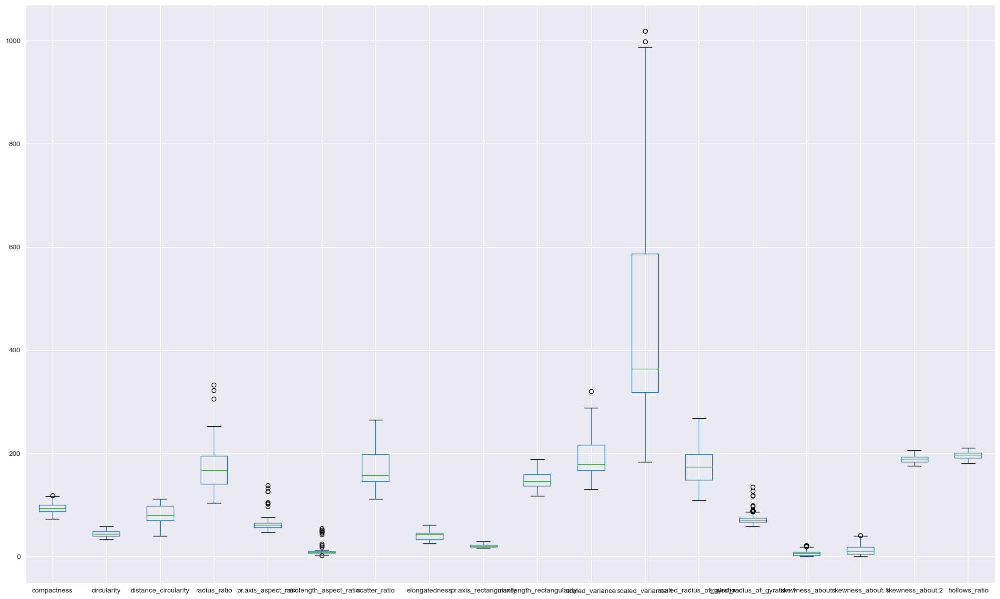

In [482]:
df.boxplot(figsize=(25,15))

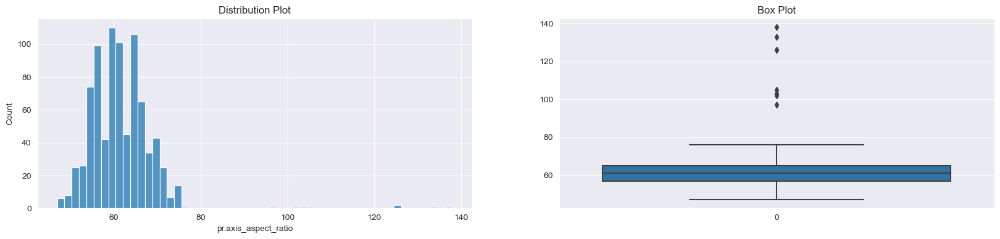

In [483]:
fig,(ax1,ax2) = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(20,4)
sns.histplot(df['pr.axis_aspect_ratio'],ax=ax1)
ax1.set_title("Distribution Plot")

sns.boxplot(df['pr.axis_aspect_ratio'],ax=ax2)
ax2.set_title("Box Plot")
plt.show()

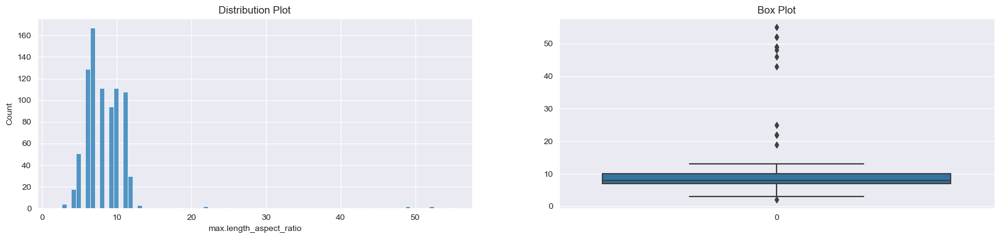

In [484]:
fig,(ax1,ax2) = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(20,4)
sns.histplot(df['max.length_aspect_ratio'],ax=ax1)
ax1.set_title("Distribution Plot")

sns.boxplot(df['max.length_aspect_ratio'],ax=ax2)
ax2.set_title("Box Plot")
plt.show()

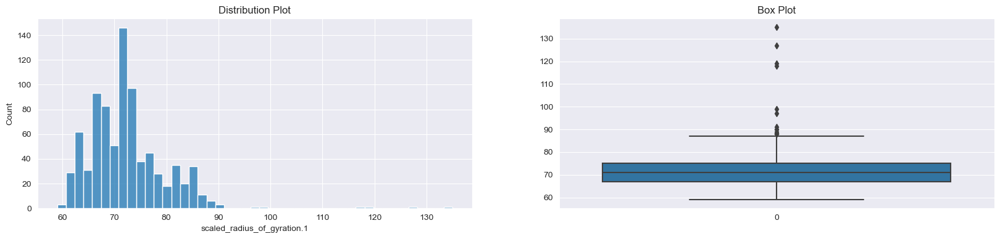

In [485]:
fig,(ax1,ax2) = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(20,4)
sns.histplot(df['scaled_radius_of_gyration.1'],ax=ax1)
ax1.set_title("Distribution Plot")

sns.boxplot(df['scaled_radius_of_gyration.1'],ax=ax2)
ax2.set_title("Box Plot")
plt.show()

We can handle these outliers with using replace_with_thresholds function and change outlier values with threshold values.

In [486]:
for col in df.columns:
    if check_outlier(df, col):
        replace_with_thresholds(df,col)

<AxesSubplot: >

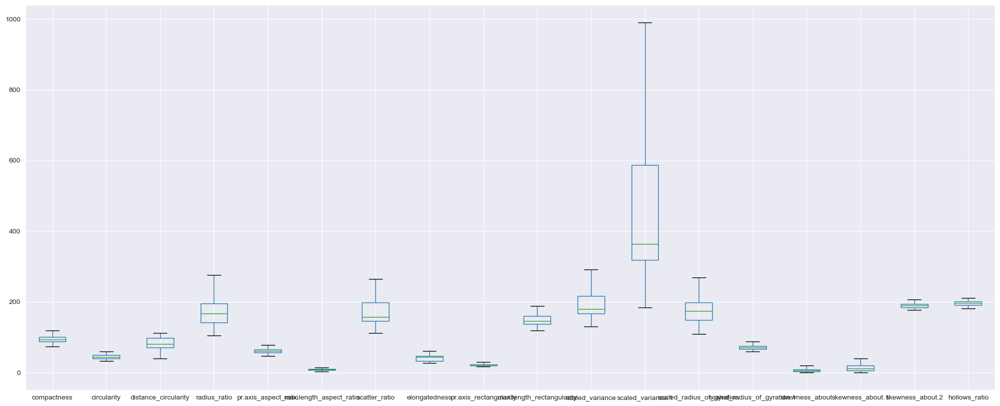

In [487]:
df.boxplot(figsize=(25,10))

No more outlier in the data, we can easly observe this from boxplots.

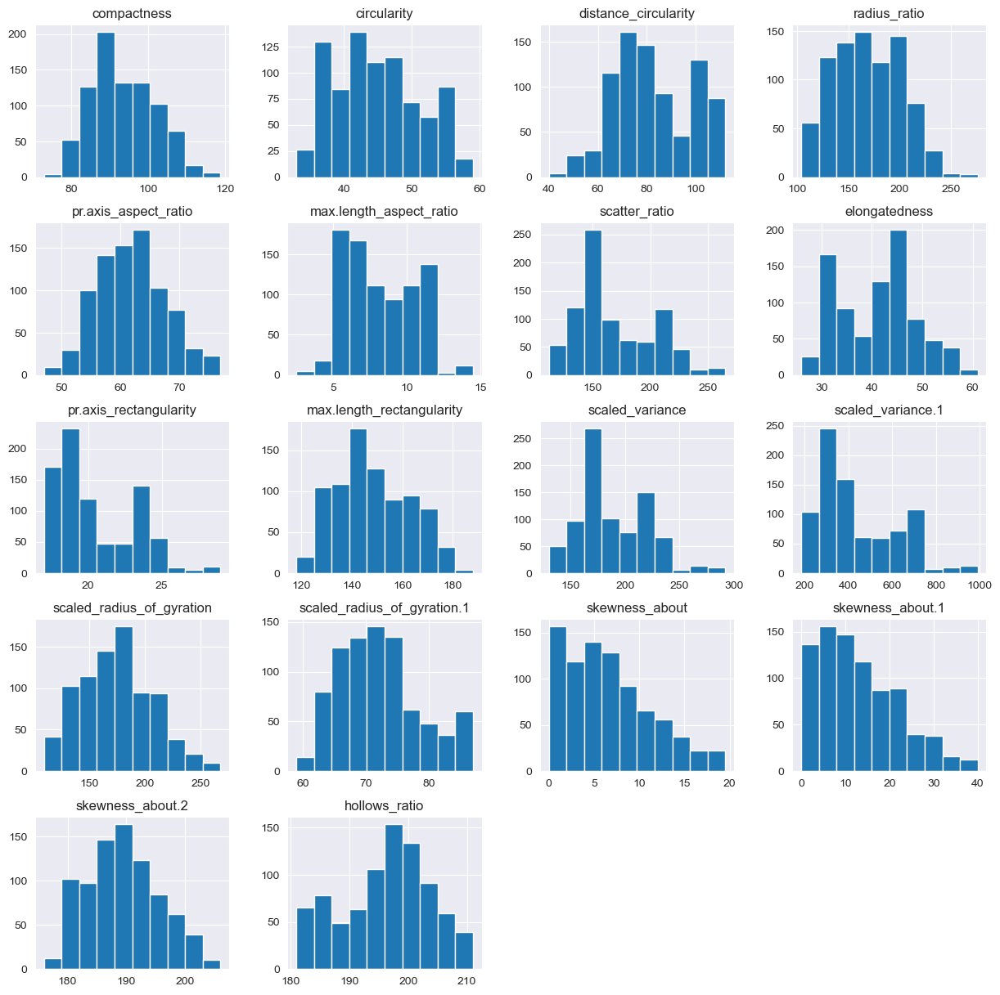

In [488]:
df.hist(figsize=(15,15))
plt.show()

We can understand the distribution of data with using histograms for all numerical features.

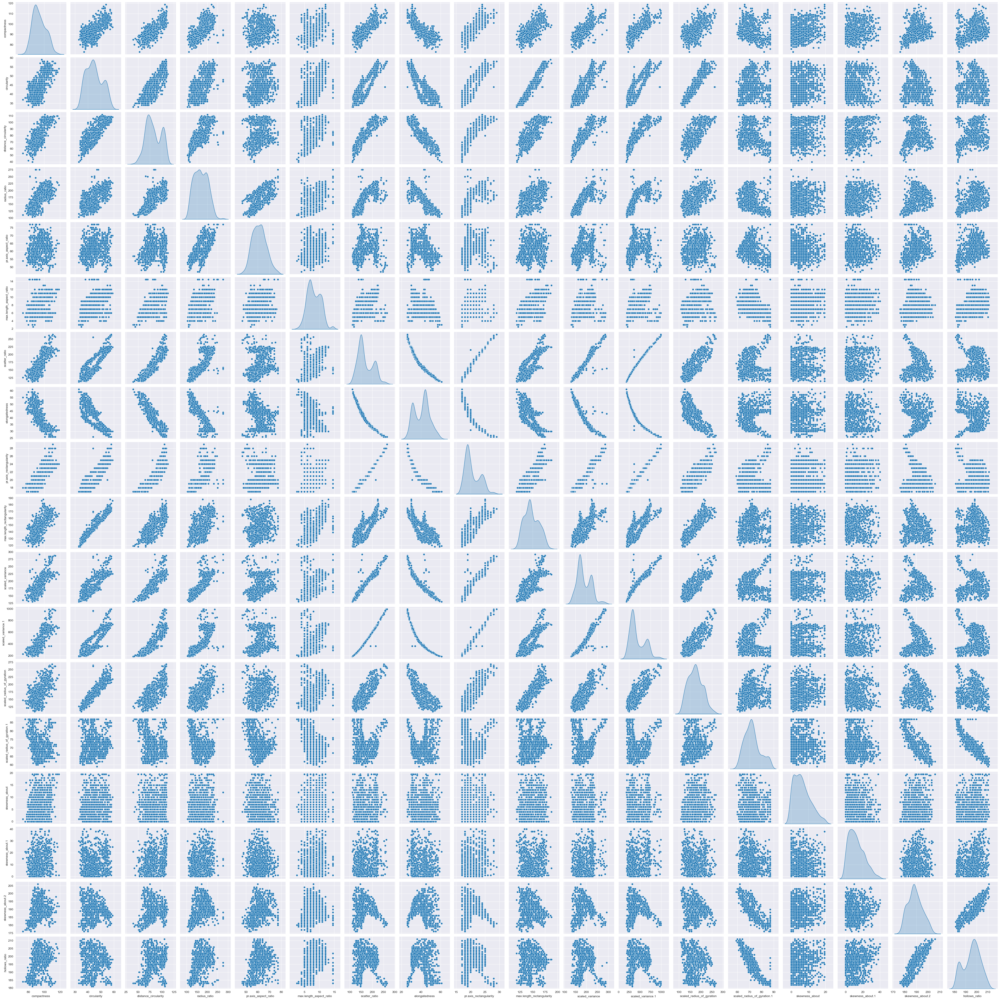

In [489]:
sns.pairplot(df,diag_kind='kde')

# Normalization and Feature Selection

For normalization StandardScaler has been used and applied to the data.

In [490]:
standard_scaler = StandardScaler()

In [491]:
standard_scaler.fit(df)
data = standard_scaler.transform(df)

In [492]:
covariance_matrix = np.cov(data.T)
print('Covariance Matrix')
covariance_matrix

Covariance Matrix


array([[ 1.00119332e+00,  6.87445114e-01,  7.90891720e-01,
         7.01964402e-01,  1.61513764e-01,  4.37414717e-01,
         8.13296778e-01, -7.88914260e-01,  8.13743629e-01,
         6.76442661e-01,  7.67500715e-01,  8.14187552e-01,
         5.85638810e-01, -2.61653826e-01,  2.32588980e-01,
         1.60545432e-01,  2.92499739e-01,  3.59444246e-01],
       [ 6.87445114e-01,  1.00119332e+00,  7.94450121e-01,
         6.32328647e-01,  1.96895876e-01,  5.25664608e-01,
         8.51375681e-01, -8.22897040e-01,  8.45901682e-01,
         9.63772098e-01,  7.99385826e-01,  8.38277156e-01,
         9.27835429e-01,  5.78827874e-02,  1.44794128e-01,
        -8.75914013e-03, -1.10579255e-01,  4.26224137e-02],
       [ 7.90891720e-01,  7.94450121e-01,  1.00119332e+00,
         7.82173559e-01,  2.25484486e-01,  6.10887096e-01,
         9.07572702e-01, -9.12696633e-01,  8.94107592e-01,
         7.74570065e-01,  8.67327892e-01,  8.87371513e-01,
         7.06154945e-01, -2.48346901e-01,  1.11940705e

In [493]:
print(covariance_matrix.shape)

(18, 18)


Then PCA applied to the scaled data:

*PCA technique is particularly useful in processing data where multi-colinearity exists between the features/variables. PCA can be used when the dimensions of the input features are high (e.g. a lot of variables). PCA can be also used for denoising and data compression*

In [494]:
pca_applied_data = PCA(n_components = 18)
pca_applied_data.fit(data)

PCA(n_components=18)

eigen_values created from pca_applied_data explained_variance_ attribute.

In [495]:
eigen_values = pca_applied_data.explained_variance_
print("Eigen Values:")
pd.DataFrame(eigen_values).transpose()

Eigen Values:


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
0,9.684605,3.305193,1.199697,1.174362,0.874951,0.744022,0.345897,0.222433,0.133758,0.0968,0.061235,0.056553,0.041342,0.030933,0.02112,0.016976,0.009928,0.001675


eigen_vectors created from pca_applied_data with using components_ attribute.

In [496]:
eigen_vectors = pca_applied_data.components_
eigen_vectors

array([[ 2.72285701e-01,  2.89082867e-01,  3.02732761e-01,
         2.67396295e-01,  9.45226024e-02,  1.83503859e-01,
         3.11704791e-01, -3.09503304e-01,  3.08166113e-01,
         2.79439852e-01,  3.02040899e-01,  3.07605721e-01,
         2.65364007e-01, -3.95485828e-02,  4.05936167e-02,
         5.95376576e-02,  3.32430486e-02,  8.00033722e-02],
       [-9.28442059e-02,  1.27257622e-01, -5.38798279e-02,
        -1.94512337e-01, -2.40658480e-01, -1.03914798e-01,
         7.04922642e-02, -7.75164361e-03,  8.33338775e-02,
         1.17300748e-01,  7.28547094e-02,  7.80172848e-02,
         2.07785166e-01,  5.00925176e-01, -3.89853084e-02,
        -9.85998358e-02, -5.08199928e-01, -5.14776813e-01],
       [ 1.54453274e-02, -2.06925607e-01,  9.11992746e-02,
        -3.25070032e-02, -2.52702666e-01, -1.49728587e-01,
         1.20339886e-01, -8.72741210e-02,  1.25841300e-01,
        -2.06495388e-01,  1.18537771e-01,  1.25378756e-01,
        -2.13794292e-01,  1.96243945e-02, -3.93251823e

variance_ratio also created from pca_applied_data with using explained_variance_ratio_.

In [497]:
variance_ratio =  pca_applied_data.explained_variance_ratio_
variance_ratio

array([5.37392313e-01, 1.83402953e-01, 6.65703920e-02, 6.51645661e-02,
       4.85504485e-02, 4.12853131e-02, 1.91935803e-02, 1.23426385e-02,
       7.42215061e-03, 5.37138801e-03, 3.39786766e-03, 3.13810257e-03,
       2.29405563e-03, 1.71642493e-03, 1.17192744e-03, 9.42006642e-04,
       5.50917193e-04, 9.29541624e-05])

Plotting the Eigen value - Cum of variation explained curve.

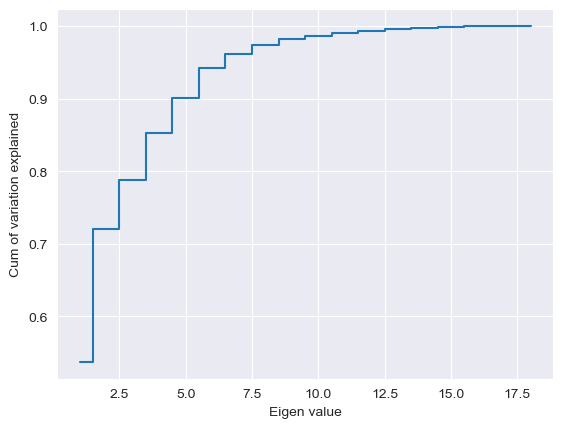

In [498]:
plt.step(list(range(1,19)), np.cumsum(variance_ratio), where = 'mid')
plt.ylabel('Cum of variation explained')
plt.xlabel('Eigen value')
plt.show()

Plotting Eigen values with using bar plot.

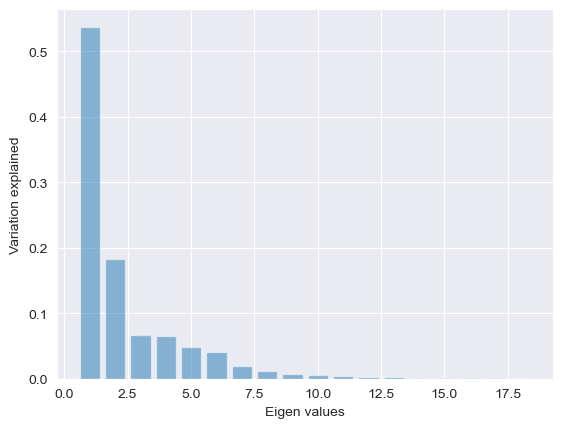

In [499]:
plt.bar(list(range(1,19)), variance_ratio, alpha = 0.5, align = 'center')
plt.ylabel('Variation explained')
plt.xlabel('Eigen values')
plt.show()

Applying PCA for 8 components for understand the relation with pair plots.

In [500]:
new_pca_applied_data = PCA(n_components = 8)
new_pca_applied_data.fit(data)

PCA(n_components=8)

In [501]:
new_pca_applied_data = new_pca_applied_data.transform(data)
new_pca_applied_data.shape

(839, 8)

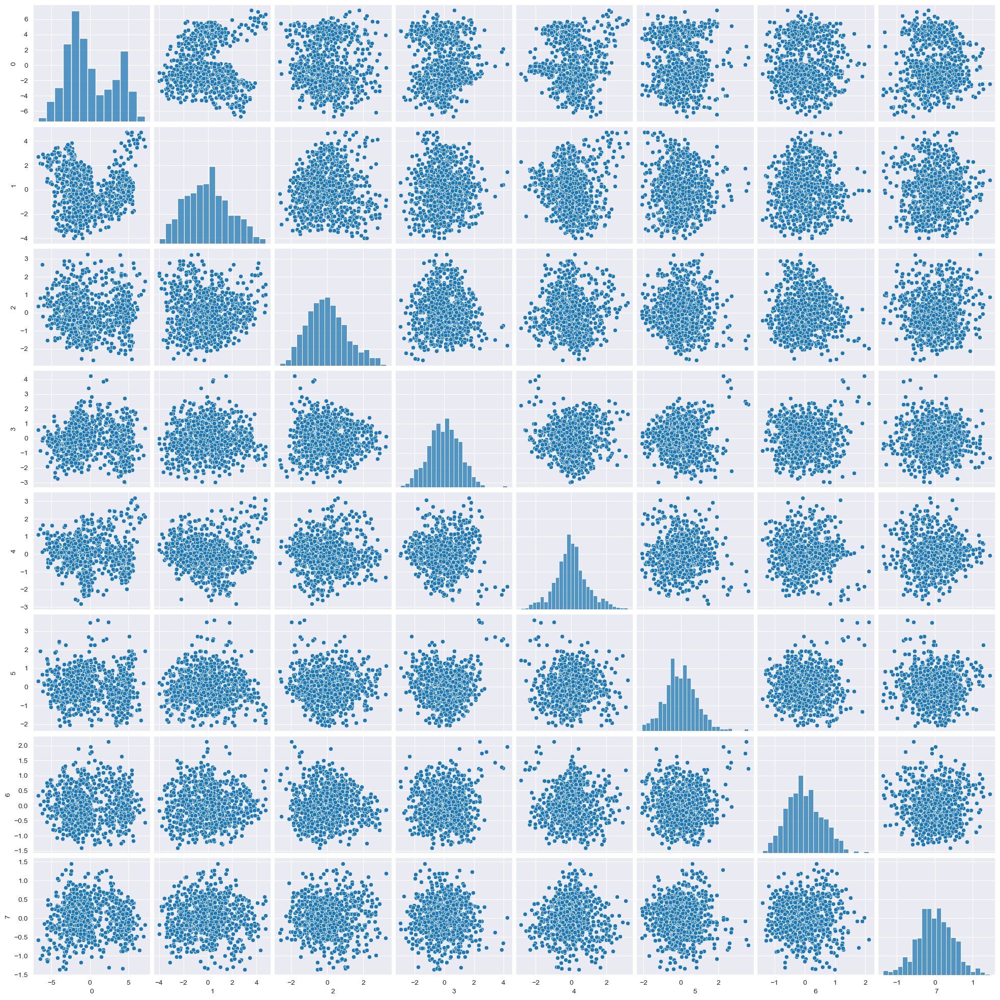

In [502]:
sns.pairplot(pd.DataFrame(new_pca_applied_data))

## Clustering Algorithms

**Centroid Models :** These are iterative clustering algorithms in which the notion of similarity is derived by the closeness of a data point to the centroid of the clusters. K-Means clustering algorithm is a popular algorithm that falls into this category.

**Distribution models**: These clustering models are based on the notion of how probable is it that all data points in the cluster belong to the same distribution. A popular example of these models is the Expectation-maximization algorithm which uses multivariate normal distributions.

**Density Models**: These models search the data space for areas of varied density of data points in the data space Popular examples of density models are DBSCAN and OPTICS.

**Hierarchical-based Models**: Hierarchical-based clustering is typically used on hierarchical data, like you would get from a company database or taxonomies. It builds a tree of clusters so everything is organized from the top-down. This is more restrictive than the other clustering types, but it's perfect for specific kinds of data sets.

# Kmeans Clustering

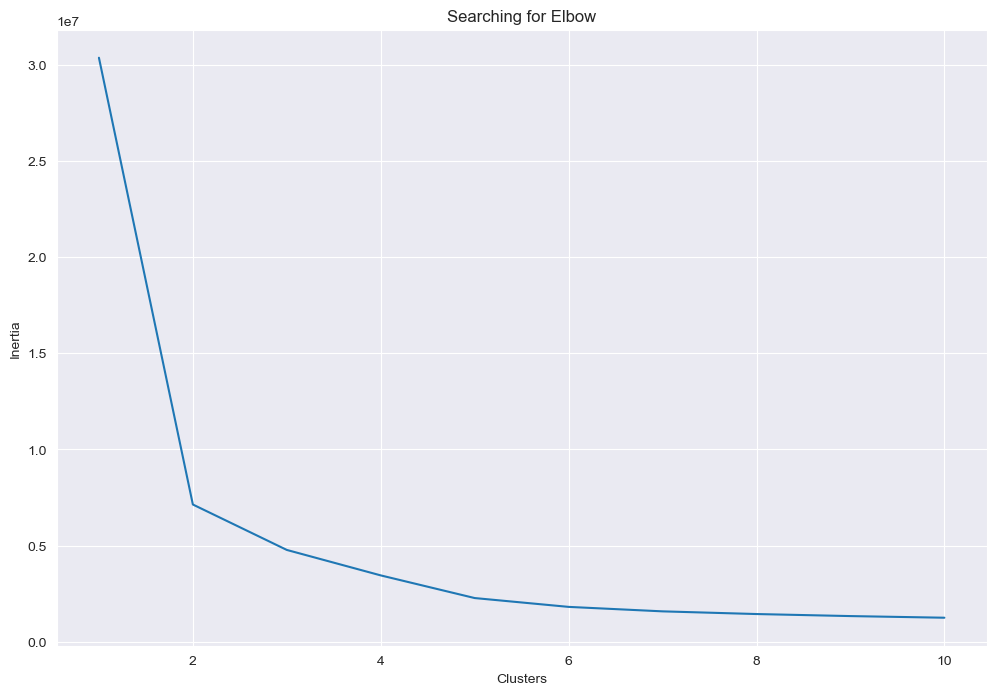

In [503]:
clusters = []
for i in range(1, 11):
    km = KMeans(n_clusters=i).fit(df)
    clusters.append(km.inertia_)

fig, ax = plt.subplots(figsize=(12, 8))
sns.lineplot(x=list(range(1, 11)), y=clusters, ax=ax)
ax.set_title('Searching for Elbow')
ax.set_xlabel('Clusters')
ax.set_ylabel('Inertia')
plt.show()

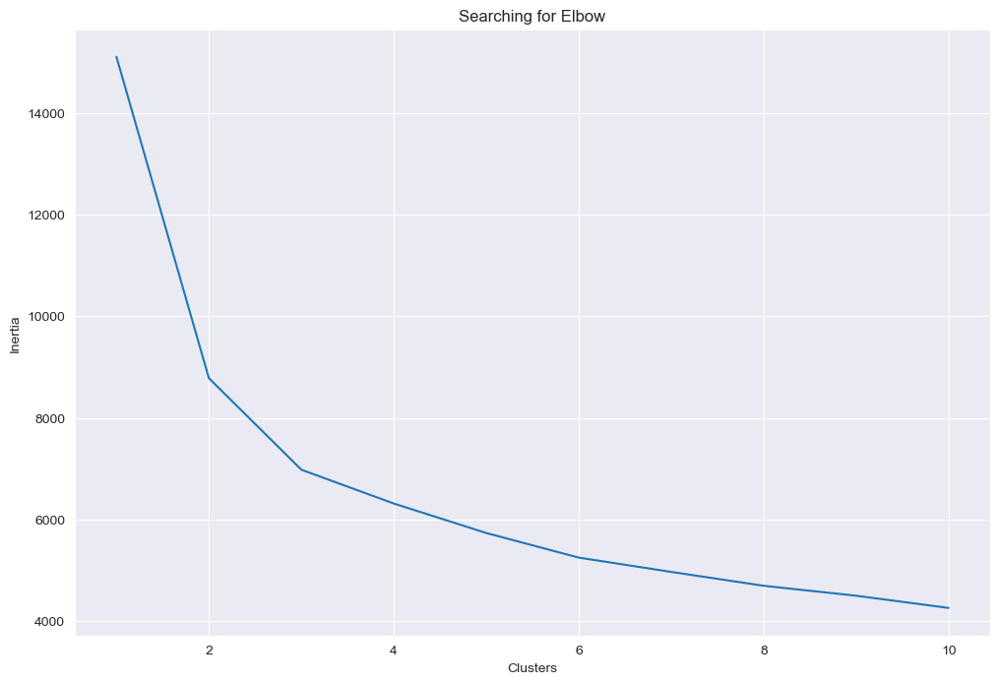

In [504]:
clusters = []
new_data = pd.DataFrame(pca_applied_data.transform(data))
for i in range(1, 11):
    km = KMeans(n_clusters=i).fit(new_data)
    clusters.append(km.inertia_)

fig, ax = plt.subplots(figsize=(12, 8))
sns.lineplot(x=list(range(1, 11)), y=clusters, ax=ax)
ax.set_title('Searching for Elbow')
ax.set_xlabel('Clusters')
ax.set_ylabel('Inertia')
plt.show()

In [505]:
from sklearn.metrics import silhouette_score
for n_clusters in range(2,7):
    kmeans_model = KMeans(n_clusters=n_clusters, random_state=0)
    kmeans_model = kmeans_model.fit(new_data)
    label=kmeans_model.predict(new_data)
    print("Silhouette Score","for n=",n_clusters,silhouette_score(new_data, label))

Silhouette Score for n= 2 0.37294113732833867
Silhouette Score for n= 3 0.2843028024404906
Silhouette Score for n= 4 0.23530270697600508
Silhouette Score for n= 5 0.23728105102194863
Silhouette Score for n= 6 0.22800611422463635


In [506]:
for n_clusters in range(2,7):
    kmeans_model = KMeans(n_clusters=n_clusters, random_state=0)
    kmeans_model = kmeans_model.fit(df)
    label=kmeans_model.predict(df)
    print("Silhouette Score","for n =",n_clusters,silhouette_score(df, label))

Silhouette Score for n = 2 0.6743591961271794
Silhouette Score for n = 3 0.5254767127674537
Silhouette Score for n = 4 0.44286590458379443
Silhouette Score for n = 5 0.47193897550297
Silhouette Score for n = 6 0.43921586970475535


Silhouette Score for not applied pca and standard scaler data is much better than the applied data. So we will use original df. Also we can say that the optimal number of clusters is 2 as its silhouette score is greater than that of 3 clusters.

In [507]:
kmeans = KMeans(n_clusters=2)
kmeans.fit(df)
predictions = kmeans.predict(df)

With creating a scatter plot of the data according to the compactness and circularity columns, coloring each point according to its cluster label we can easily observe the clusters.

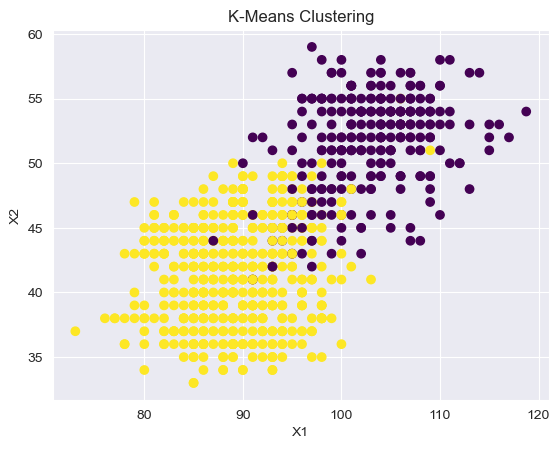

In [508]:
plt.scatter(df.iloc[:, 0], df.iloc[:, 1], c=predictions, cmap='viridis')

plt.xlabel('X1')
plt.ylabel('X2')
plt.title('K-Means Clustering')

plt.show()

# Agglomerative     Clustering

Agglomerative is the bottom up approach which is more popular than Divisive clustering. The Agglomerative Clustering class will require two inputs:

n_clusters: The number of clusters to form as well as the number of centroids to generate.

linkage: Which linkage criterion to use. The linkage criterion determines which distance to use between sets of observation. The algorithm will merge the pairs of cluster that minimize this criterion.


In [509]:
for n_clusters in range(2,7):
    agglomerative_clustering_model = AgglomerativeClustering(n_clusters=n_clusters)
    agglomerative_cluster_labels = agglomerative_clustering_model.fit_predict(df)
    silhouette_avg = silhouette_score(df, agglomerative_cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

For n_clusters = 2 The average silhouette_score is : 0.6663464996157479
For n_clusters = 3 The average silhouette_score is : 0.4904033818463678
For n_clusters = 4 The average silhouette_score is : 0.5078305307665734
For n_clusters = 5 The average silhouette_score is : 0.46160007894666566
For n_clusters = 6 The average silhouette_score is : 0.42007192141983607


When we observe the silhouette_scores according to the different number clusters,  2 is optimal value again.

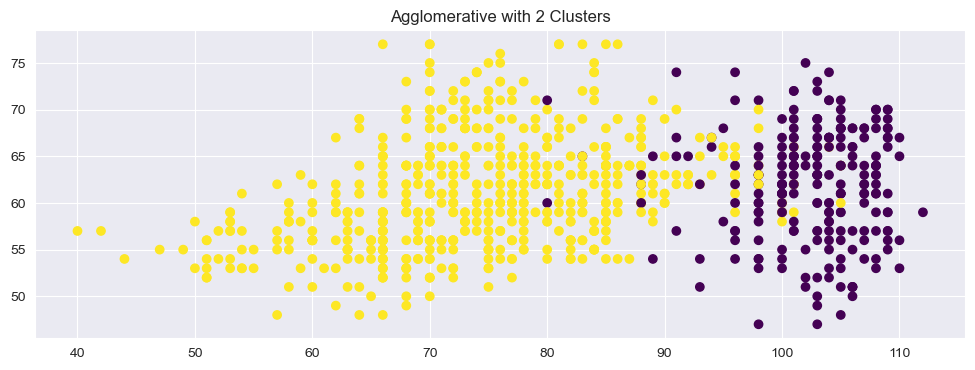

In [510]:
agglomerative_clustering_model = AgglomerativeClustering(n_clusters=2, linkage='average').fit(df)

labels = agglomerative_clustering_model.labels_
plt.figure(figsize=(12, 4))
plt.scatter(df.iloc[:, 2], df.iloc[:, 4], c=labels, cmap='viridis')
plt.title('Agglomerative with 2 Clusters')
plt.show()

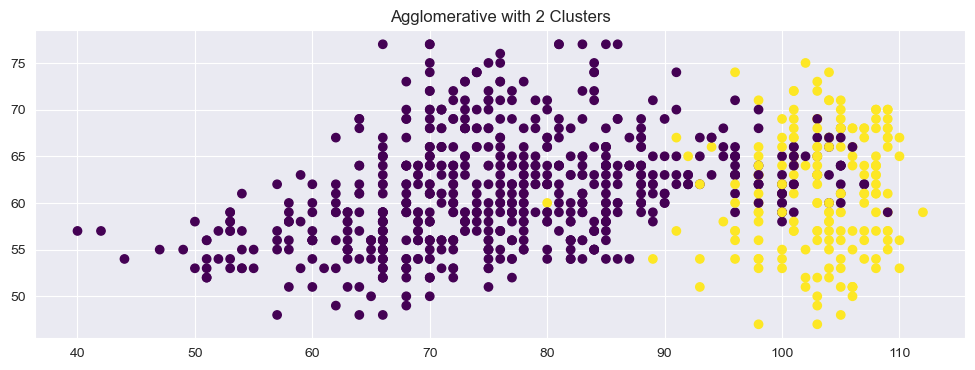

In [511]:
agglomerative_clustering_model = AgglomerativeClustering(n_clusters=2, linkage='complete').fit(df)

labels = agglomerative_clustering_model.labels_
plt.figure(figsize=(12, 4))
plt.scatter(df.iloc[:, 2], df.iloc[:, 4], c=labels, cmap='viridis')
plt.title('Agglomerative with 2 Clusters')
plt.show()

A Hierarchical clustering is typically visualized as a dendrogram as shown in the following cell. Each merge is represented by a horizontal line. The y-coordinate of the horizontal line is the similarity of the two clusters that were merged, where cities are viewed as singleton clusters. By moving up from the bottom layer to the top node, a dendrogram allows us to reconstruct the history of merges that resulted in the depicted clustering.

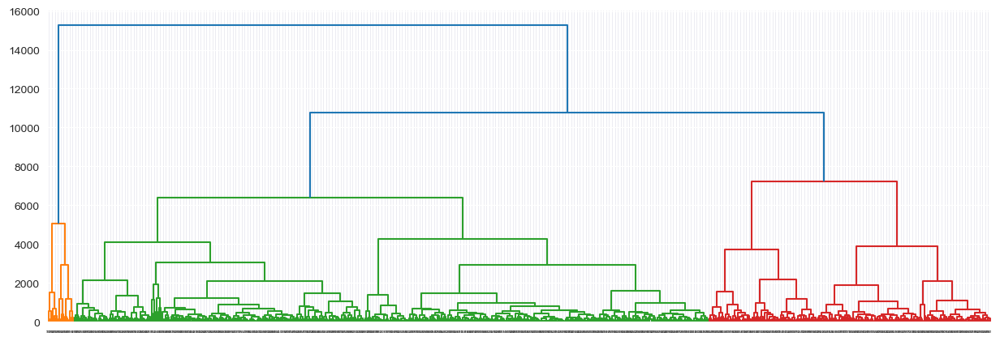

In [512]:
Z = hierarchy.linkage(distance_matrix(df, df), 'complete')
plt.figure(figsize=(15, 5))
dendrogram = hierarchy.dendrogram(Z, leaf_rotation=0, leaf_font_size=2, orientation='top')

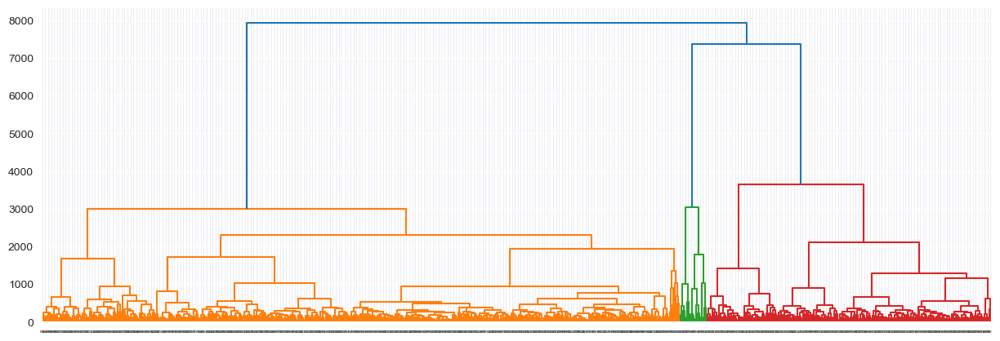

In [513]:
Z = hierarchy.linkage(distance_matrix(df, df), 'average')
plt.figure(figsize=(15, 5))
dendrogram = hierarchy.dendrogram(Z, leaf_rotation=0, leaf_font_size=2, orientation='top')

We observe that different dendograms occur for different linkage values. Average value seems more appropriate for our problem.

# Density Based Clustering (DBSCAN) Clustering

Most of the traditional clustering techniques, such as k-means, hierarchical and fuzzy clustering, can be used to group data without supervision.

However, when applied to tasks with arbitrary shape clusters, or clusters within cluster, the traditional techniques might be unable to achieve good results. That is, elements in the same cluster might not share enough similarity or the performance may be poor. Additionally, Density-based Clustering locates regions of high density that are separated from one another by regions of low density. Density, in this context, is defined as the number of points within a specified radius.

DBSCAN stands for Density-Based Spatial Clustering of Applications with Noise. This technique is one of the most common clustering algorithms which works based on density of object. The whole idea is that if a particular point belongs to a cluster, it should be near to lots of other points in that cluster. It works based on two parameters: Epsilon and Minimum Points:

Epsilon: determine a specified radius that if includes enough number of points within, we call it dense area
minimumSamples: determine the minimum number of data points we want in a neighborhood to define a cluster.

In [514]:
for min_sample in range(3,12):
    dbscan_model = DBSCAN(eps=40,min_samples=min_sample)
    dbscan_model_labels = dbscan_model.fit_predict(df)
    silhouette_avg = silhouette_score(df, dbscan_model_labels)
    print("For n_clusters =", min_sample,
          "The average silhouette_score is :", silhouette_avg)

For n_clusters = 3 The average silhouette_score is : 0.1383098694596613
For n_clusters = 4 The average silhouette_score is : 0.23516032262622089
For n_clusters = 5 The average silhouette_score is : 0.31549952637949374
For n_clusters = 6 The average silhouette_score is : 0.3798676767389092
For n_clusters = 7 The average silhouette_score is : 0.3798676767389092
For n_clusters = 8 The average silhouette_score is : 0.3798676767389092
For n_clusters = 9 The average silhouette_score is : 0.44610359745238054
For n_clusters = 10 The average silhouette_score is : 0.4425453294803769
For n_clusters = 11 The average silhouette_score is : 0.4425453294803769


After observing the silhouette_scores for different min_samples values 9 value seems to optimal value.

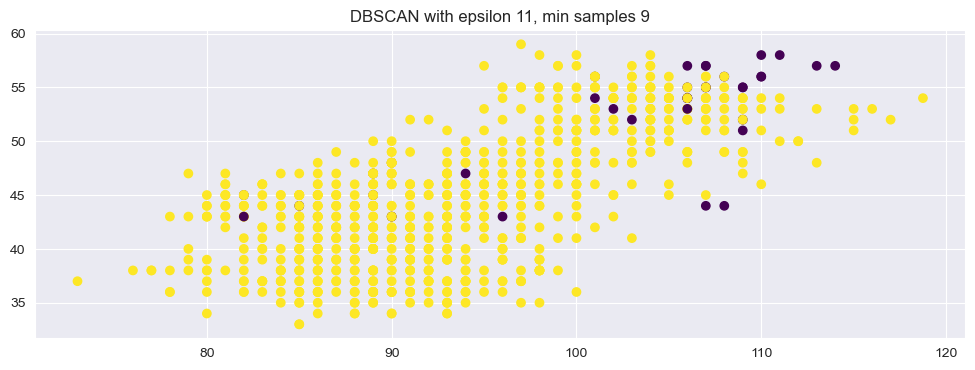

In [515]:
db = DBSCAN(eps=40, min_samples=9).fit(df)

labels = db.labels_
plt.figure(figsize=(12, 4))
plt.scatter(df.iloc[:, 0], df.iloc[:, 1], c=labels, cmap='viridis')
plt.title('DBSCAN with epsilon 11, min samples 9')
plt.show()

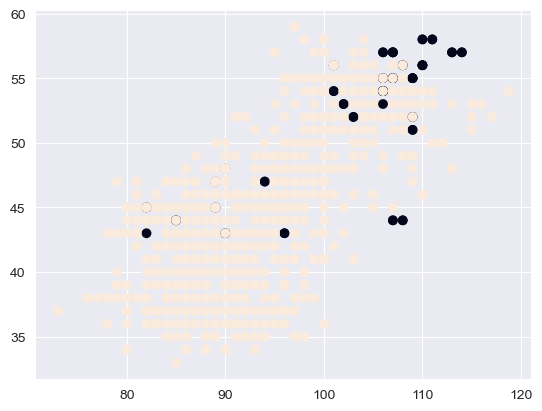

In [516]:
dbscan_clusters = unique(labels)
for dbscan_cluster in dbscan_clusters:
    # get data points that fall in this cluster
    index = where(labels == dbscan_clusters)
    # make the plot
    pyplot.scatter(df.iloc[:, 0], df.iloc[:, 1],c=labels)

# show the DBSCAN plot
pyplot.show()

# Gaussian Mixture Clustering

Gaussian mixture models (GMMs) are often used for data clustering. You can use GMMs to perform either hard clustering or soft clustering on query data. To perform hard clustering, the GMM assigns query data points to the multivariate normal components that maximize the component posterior probability, given the data.

Gaussian Mixture Models (GMMs) assume that there are a certain number of Gaussian distributions, and each of these distributions represent a cluster. Hence, a Gaussian Mixture Model tends to group the data points belonging to a single distribution together.

*Advantages:*

-The associativity of a data point to a cluster is quantified using probability metrics – which can be easily interpreted.
-Proven to be accurate for real-time data sets.
-Some versions of GMM allows for mixed membership of data points, hence it can be a good alternative to Fuzzy C Means to achieve fuzzy clustering.

*Disadvantages:*

-Complex algorithm and cannot be applicable to larger data
-It is hard to find clusters if the data is not Gaussian, hence a lot of data preparation is required.

In [517]:
from sklearn.mixture import GaussianMixture
for n_component in range(2,7):
    gaussian_model = GaussianMixture(n_components= n_component)
    gaussian_model_labels = gaussian_model.fit_predict(df)
    silhouette_avg = silhouette_score(df, gaussian_model_labels)
    print("For n_clusters =", n_component,
          "The average silhouette_score is :", silhouette_avg)

For n_clusters = 2 The average silhouette_score is : 0.578747440707399
For n_clusters = 3 The average silhouette_score is : 0.44307424720143385
For n_clusters = 4 The average silhouette_score is : 0.252120239773435
For n_clusters = 5 The average silhouette_score is : 0.26691480334026657
For n_clusters = 6 The average silhouette_score is : 0.38383289802555076


Again n_component = 2 gives the best silhouette_score for our data.

In [518]:
gaussian_model = GaussianMixture(n_components=2)
gaussian_model.fit(df)
gaussian_result = gaussian_model.predict(df)
gaussian_clusters = unique(gaussian_result)

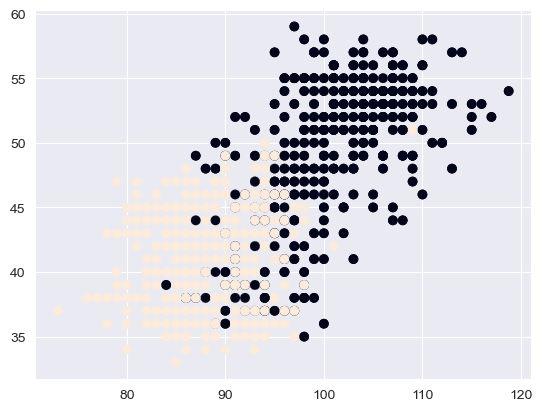

In [522]:
for gaussian_cluster in gaussian_clusters:
    index = where(gaussian_result == gaussian_clusters)
    pyplot.scatter(df.iloc[:, 0], df.iloc[:, 1],c=gaussian_result)
pyplot.show()

# Summarizing and Interpreting Results

Clustering is a way of grouping the data points into different clusters, consisting of similar data points. In this assignment, Clustering algorithms, which is an unsupervised learning method, were examined and 4 different clustering algorithms were used. Different models were created using Kmeans, Agglomerative, Gaussian Mixture and Density Based Clustering (DBSCAN) Clustering algorithms. Before these models were created, different parameters were tried for appropriate parameter selection and the values with the highest silhouette_score were selected. A value of 2 for the number of clusters was the highest overall. It was observed that the kmeans algorithm had the highest silhouette_score among all models. In addition, clusters were observed with scatter plots created for each model. In the Agglomerative Clustering algorithm, different parameters were also tried for linkage and dendograms were created with them. Here, too, the most appropriate parameter value was selected.
In this assignment, where I was able to observe the structure and results of algorithms by creating different models with Clustering algorithms used in areas such as Market Segmentation, Statistical data analysis, Social network analysis, Image segmentation, Anomaly detection, I also observed the effect of Feature Selection and Normalization on the results. I saw that the results and silhouette_score values in the normalized data are lower.